In [16]:
import numpy as np
from scipy.integrate import solve_ivp

# Set initial concentrations of all species in the MAPK model
dir_initial_concentrations = {
    "RAS": 18900,
    "RAF": 66.4,
    "RAFp": 1.0,
    "MEK": 36500,
    "MEKp": 1.0,
    "MEKpp": 1.0,
    "ERK": 34900,
    "ERKp": 1.0,
    "ERKpp": 1.0,
    "PP2A": 150,
    "MKP3": 2.4
}

# Define parameter estimates, as derived from literature (Geoffrey et all, A decompositional approach to parameter estimation in pathway modeling: a case study of \\
# the Akt and MAPK pathways and their crosstalk)
dir_param_estimates = {
    "D": [0.09, 5.6, 0.45, 5.17, 0.4, 0.089, 30, 0.0308, 32],
    "Km": [50, 7200, 1250, 24500, 4316, 52000, 160, 55000, 60]
}

# Set generation rates, 0.1 are arbitraty values
dir_generation_rates = {
    "mRAS": 0.1,
    "mRAF": 0.1,
    "mRAFp": 0.1,
    "mMEK": 0.1
}

# Set parameter values for parameters that are not present in the Geoffrey et al. paper ("A decompositional approach to parameter estimation in pathway modeling: a case study of \\
# the Akt and MAPK pathways and their crosstalk")
unknown_parameters = [10000.1, 5000.1, 400.1, 16151510.1, 0151.1, 000.1]
#unknown_parameters = [1, 1, 1, 1, 1, 1]

# Flatten the initial concentrations for use in the ODE solver
initial_concentrations = list(dir_initial_concentrations.values())

# Ensure there are 11 initial conditions corresponding to 11 ODEs
assert len(initial_concentrations) == 11, "Mismatch in the number of initial conditions."

# Define function containing the ODEs for the MAPK model
def get_ODEs(t, y, generation_rates, param_estimates, unknown_parameters):
    """
    Compute the ODEs for the MAPK model.
    """
    RAS, RAF, RAFp, MEK, MEKp, MEKpp, ERK, ERKp, ERKpp, PP2A, MKP3 = y

    # Unpack generation rates and parameters
    mRAS, mRAF, mRAFp, mMEK = generation_rates.values()
    D = param_estimates['D']
    Km = param_estimates['Km']
    k0, k1, k2, k3, k4, k5 = unknown_parameters

    # Reactions
    R0 = mRAS * (k0 / (k0 + ERKp)) * (k1 / (k1 + ERKpp))
    R1 = mRAFp * (k2 / (k2 + ERKp)) * (k3 / (k3 + ERKpp))
    R2 = mMEK * (k4 / (k4 + ERKp)) * (k5 / (k5 + ERKpp))

    F_D0 = RAF * RAS * (D[0] / (Km[0] + RAF))
    F_D1 = MEK * RAFp * (D[1] / (Km[1] + MEK))
    F_D2 = MEKp * PP2A * (D[2] / (Km[2] + MEKp))
    F_D3 = MEKp * RAFp * (D[3] / (Km[3] + MEKp))
    F_D4 = MEKpp * PP2A * (D[4] / (Km[4] + MEKpp))
    F_D5 = ERK * MEKpp * (D[5] / (Km[5] + ERK))
    F_D6 = ERKp * MKP3 * (D[6] / (Km[6] + ERKp))
    F_D7 = ERKp * MEKpp * (D[7] / (Km[7] + ERKp))
    F_D8 = ERKpp * MKP3 * (D[8] / (Km[8] + ERKpp))

    # Set degeneration rate constant g
    #g = 0.01
    g = 0.0002

    # ODEs
    dRAS = R0 - g * RAS
    dRAF = mRAF - F_D0 - g * RAF
    dRAFp = R1 + F_D0 - g * RAFp
    dMEK = R2 + F_D2 - F_D1 - g * MEK
    dMEKp = F_D1 - F_D2 + F_D4 - F_D3 - g * MEKp
    dMEKpp = -F_D4 + F_D3 - g * MEKpp
    dERK = F_D6 - F_D5 - g * ERK
    dERKp = F_D5 + F_D8 - F_D7 - F_D6 - g * ERKp
    dERKpp = F_D7 - F_D8 - g * ERKpp
    dPP2A = 0
    dMKP3 = 0

    print(dRAS)

    return [dRAS, dRAF, dRAFp, dMEK, dMEKp, dMEKpp, dERK, dERKp, dERKpp, dPP2A, dMKP3]

# Define a function to find the steady state by integrating the ODEs over time
def find_steady_state(unknown_parameters):
    # Time span for the integration
    t_span = (0, 1000)
    t_eval = np.linspace(t_span[0], t_span[1], 1000)
    
    # Solve the ODEs using BDF or RK45 integration method
    sol = solve_ivp(
        get_ODEs, 
        t_span, 
        initial_concentrations, 
        args=(dir_generation_rates, dir_param_estimates, unknown_parameters),
        t_eval=t_eval,
        method='BDF',
        #method='RK45',
        vectorized=False
    )

    print(sol)

    # Check for success
    if sol.success:
        # Steady state will be the last values of the solution
        steady_state = sol.y[:, -1]
        return steady_state
    else:
        print("ODE solver failed:", sol.message)
        return None

# Find the steady state
steady_state = find_steady_state(unknown_parameters)
if steady_state is not None:
    print("Steady state concentrations:", steady_state)


-3.680029992501749
-3.680029966766808
-3.680029992501749
-3.6800299361753597
-3.680029992501749
-3.680029992501749
-3.680029992501749
-3.680029992501749
-3.680029992501749
-3.680029992501749
-3.6800299925018978
-3.680029992501451
-3.680029992501749
-3.680029992501749
-3.6800299427455103
-3.6800299427455547
-3.680029892989359
-3.68002989298941
-3.6800293954279706
-3.680029395432461
-3.680028897875507
-3.680028897880616
-3.680027195485893
-3.680027195483353
-3.680025493143318
-3.6800254931452856
-3.6800237908664135
-3.6800237908675832
-3.6800174328118405
-3.680017432813821
-3.6800110756043414
-3.6800110756013997
-3.680004719230338
-3.6800047192252436
-3.6799929896060486
-3.679992989605148
-3.6799812627827913
-3.679981262781493
-3.6799695387201634
-3.6799695387210734
-3.6799695387210813
-3.6799578173906924
-3.679957817392569
-3.6799578173925864
-3.6799443898955064
-3.6799443898950055
-3.679944389895002
-3.6799443898950037
-3.6799309659030004
-3.6799309659021615
-3.6799309659030004
-3.6799

In [17]:
import numpy as np
from scipy.integrate import solve_ivp
from itertools import product

import datetime

# Define parameter ranges, for the unkonwn parameters
parameter_ranges = {
    "k0": np.linspace(0.05, 1000, 3),
    "k1": np.linspace(0.05, 1000, 3),
    "k2": np.linspace(0.05, 1000, 3),
    "k3": np.linspace(0.05, 1000, 3),
    "k4": np.linspace(0.05, 1000, 3),
    "k5": np.linspace(0.05, 1000, 3)
}

# Define function that calculates the steady states
def find_steady_states_for_parameters(k_values):
    unknown_parameters = k_values
    steady_state = find_steady_state(unknown_parameters)
    return steady_state

# Collect all combinations of parameter values
param_combinations = list(product(*parameter_ranges.values()))

# Store steady states
steady_states = []

# Iterate over parameter combinations
for params in param_combinations:
    k_values = list(params)
    steady_state = find_steady_states_for_parameters(k_values)

    now = datetime.datetime.now()
    print(f"{now}: k_values = {k_values}, steady_state = {steady_state}")

    if steady_state is not None:
        print(f"Steady state found for k_values = {k_values}")	
        steady_states.append(steady_state)

# Analyze the steady states
unique_steady_states = np.unique(np.round(steady_states, decimals=5), axis=0)
print(f"Number of unique steady states found: {len(unique_steady_states)}")


-3.7797732426303856
-3.7797732137401256
-3.7797732426303856
-3.7797731863039963
-3.7797732426303856
-3.7797732426303856
-3.7797732426303856
-3.7797732426303856
-3.7797732426303856
-3.7797732426303856
-3.779773242633604
-3.7797732426271677
-3.7797732426303856
-3.7797732426303856
-3.7797731867777977
-3.7797731867774984
-3.7797731309223885
-3.779773130922042
-3.779772572245178
-3.779772572214935
-3.779772013285581
-3.7797720132513977
-3.779770098737374
-3.7797700987545544
-3.7797681812858337
-3.7797681812742594
-3.779766260821047
-3.779766260814979
-3.7797590609401066
-3.7797590609612897
-3.7797518202562075
-3.779751820328636
-3.779744539426278
-3.779744539516597
-3.7797309983669907
-3.779730998374789
-3.77971732542266
-3.779717325457362
-3.7797035235441783
-3.779703523564376
-3.779703523564545
-3.7796895951117437
-3.779689595121378
-3.7796895951217424
-3.779673482013884
-3.77967348200514
-3.779673482005062
-3.7796734820050957
-3.779657208102866
-3.7796572080928157
-3.779657208102866
-3.7

In [24]:
print(unique_steady_states)
type(unique_steady_states)
print(len(unique_steady_states))
print(unique_steady_states[1])

[[1.54740258e+04 3.59000000e-03 1.47865850e+02 ... 2.18402253e+04
  1.50000000e+02 2.40000000e+00]
 [1.54740258e+04 3.59000000e-03 1.47865850e+02 ... 2.18402275e+04
  1.50000000e+02 2.40000000e+00]
 [1.54740258e+04 3.59000000e-03 1.47865850e+02 ... 2.18402275e+04
  1.50000000e+02 2.40000000e+00]
 ...
 [1.54799016e+04 3.59000000e-03 1.45827960e+02 ... 2.18309064e+04
  1.50000000e+02 2.40000000e+00]
 [1.54799016e+04 3.59000000e-03 1.45827960e+02 ... 2.18311459e+04
  1.50000000e+02 2.40000000e+00]
 [1.54799016e+04 3.59000000e-03 1.45827960e+02 ... 2.18312056e+04
  1.50000000e+02 2.40000000e+00]]
729
[1.54740258e+04 3.59000000e-03 1.47865850e+02 3.67300230e+02
 1.81685043e+03 2.77011826e+04 1.50388859e+03 5.23122507e+03
 2.18402275e+04 1.50000000e+02 2.40000000e+00]


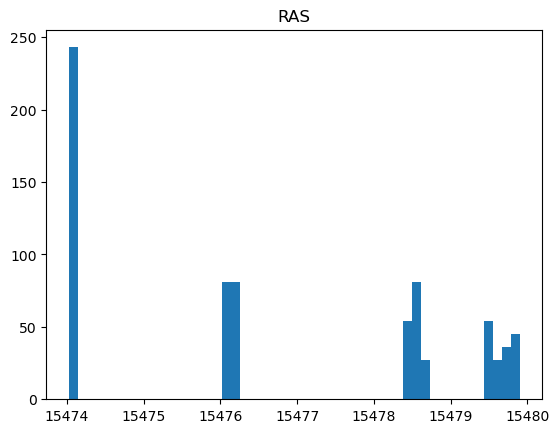

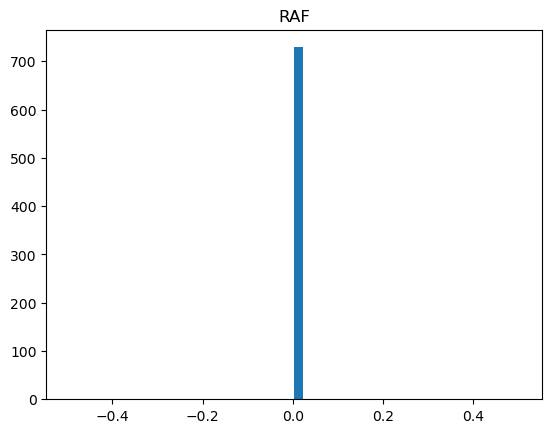

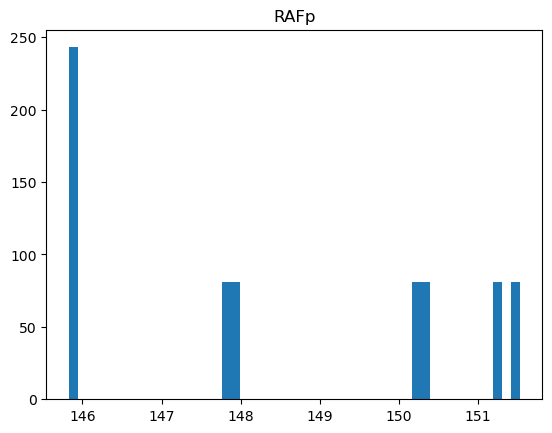

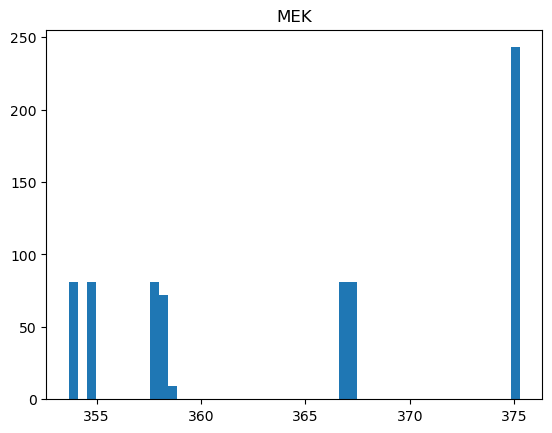

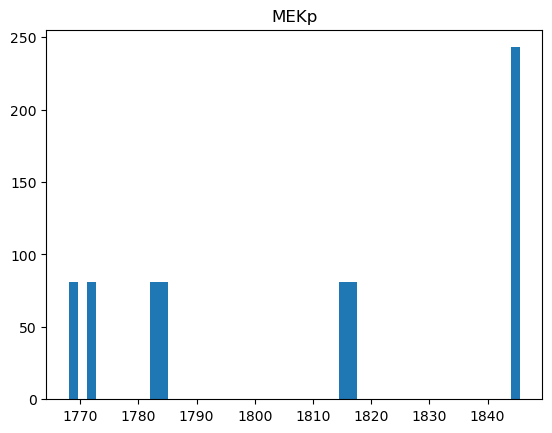

...

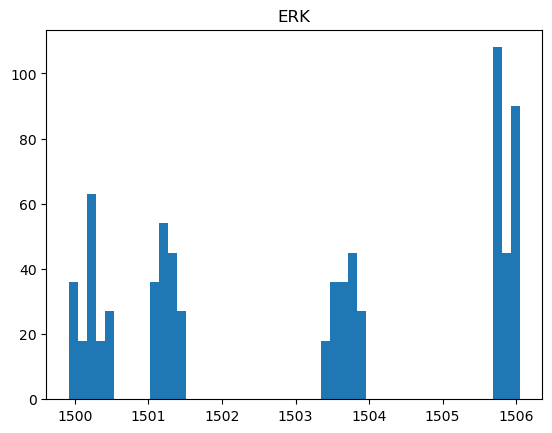

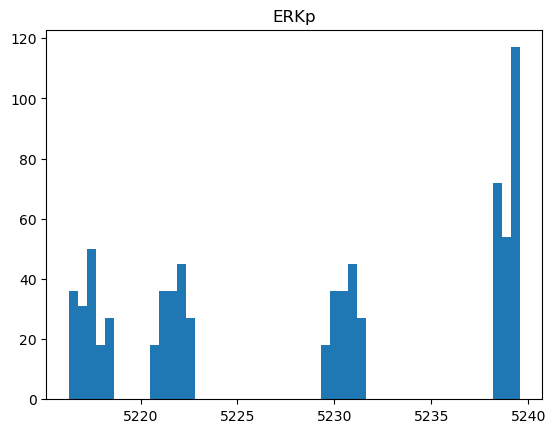

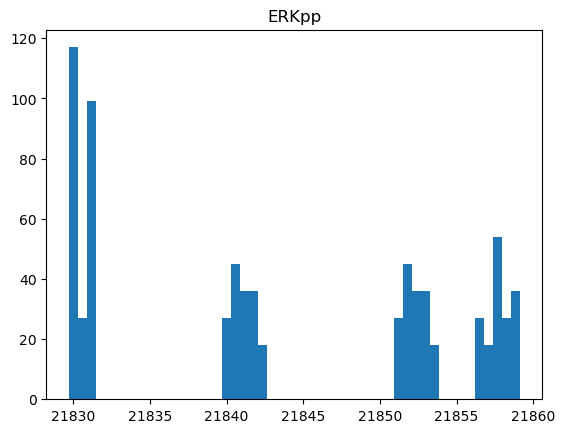

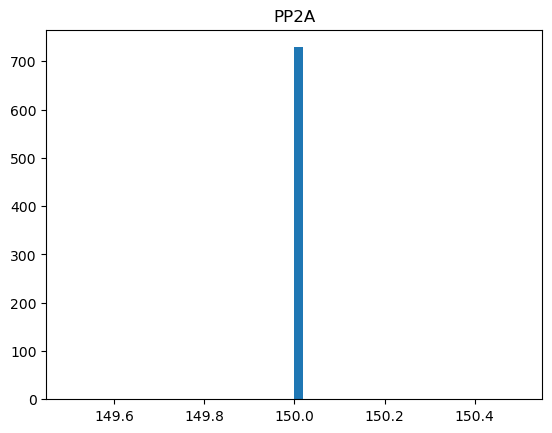

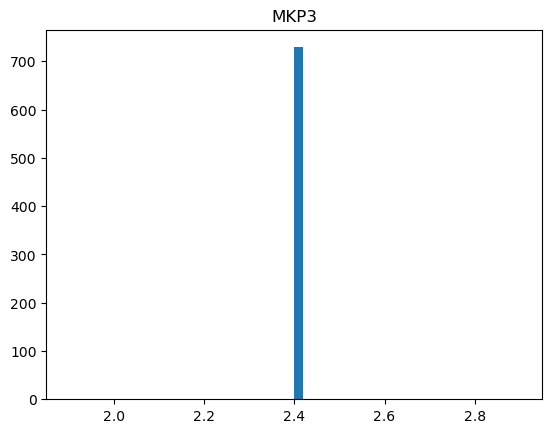

In [30]:
import matplotlib.pyplot as plt

for species in dir_initial_concentrations.keys():
    plt.figure()
    plt.hist(unique_steady_states[:, list(dir_initial_concentrations.keys()).index(species)], bins=50)
    plt.title(species)
#plt.hist(unique_steady_states[:, 5], bins=50)

